# Clasificación de Imágenes con Redes Neuronales Preentrenadas
## Comparativa y explicacion de modelos

Martin Nicolas Serafini

Mayo 2025

## Instalacion e Im portacion de Librerias

In [ ]:
# Intalacion librerías necesarias
!pip install -q torch torchvision matplotlib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image
import requests
import matplotlib.pyplot as plt
import pandas as pd


## Creo un dataframe vacio para guardar los resultados

In [ ]:
dfcomparativo = pd.DataFrame(columns=['categoria', 'modelo', 'prediccion', 'precision'])
dfcomparativo

,categoria,modelo,prediccion,precision


## Modelos disponibles



In [ ]:
import torchvision.models
print(dir(torchvision.models))

['AlexNet', 'AlexNet_Weights', 'ConvNeXt', 'ConvNeXt_Base_Weights', 'ConvNeXt_Large_Weights', 'ConvNeXt_Small_Weights', 'ConvNeXt_Tiny_Weights', 'DenseNet', 'DenseNet121_Weights', 'DenseNet161_Weights', 'DenseNet169_Weights', 'DenseNet201_Weights', 'EfficientNet', 'EfficientNet_B0_Weights', 'EfficientNet_B1_Weights', 'EfficientNet_B2_Weights', 'EfficientNet_B3_Weights', 'EfficientNet_B4_Weights', 'EfficientNet_B5_Weights', 'EfficientNet_B6_Weights', 'EfficientNet_B7_Weights', 'EfficientNet_V2_L_Weights', 'EfficientNet_V2_M_Weights', 'EfficientNet_V2_S_Weights', 'GoogLeNet', 'GoogLeNetOutputs', 'GoogLeNet_Weights', 'Inception3', 'InceptionOutputs', 'Inception_V3_Weights', 'MNASNet', 'MNASNet0_5_Weights', 'MNASNet0_75_Weights', 'MNASNet1_0_Weights', 'MNASNet1_3_Weights', 'MaxVit', 'MaxVit_T_Weights', 'MobileNetV2', 'MobileNetV3', 'MobileNet_V2_Weights', 'MobileNet_V3_Large_Weights', 'MobileNet_V3_Small_Weights', 'RegNet', 'RegNet_X_16GF_Weights', 'RegNet_X_1_6GF_Weights', 'RegNet_X_32GF_

## Preprocesamiento de Imágenes

Para que una red neuronal pueda procesar imágenes, necesitamos:
1. Redimensionar a un tamaño fijo (224x224 pixels)
2. Convertir la imagen a tensor (formato que entiende PyTorch)
3. Normalizar los valores según el estándar de ImageNet


In [ ]:
# Definimos pipeline de preprocesamiento
preprocesado = transforms.Compose([
    transforms.Resize(256),      # Redimensiona manteniendo proporción
    transforms.CenterCrop(224),  # Recorta el centro a 224x224
    transforms.ToTensor(),       # Convierte a tensor y escala a [0,1]
    transforms.Normalize(        # Normaliza según estadísticas de ImageNet
        mean=[0.485, 0.456, 0.406],  # Media por canal RGB
        std=[0.229, 0.224, 0.225]    # Desviación estándar por canal
    )
])

## ResNet

Fue diseñada para entrenar redes muy profundas (más de 100 capas) sin perder precisión, gracias a la incorporación de bloques residuales.

En vez de aprender la salida completa, solo aprende la diferencia entre la entrada y la salida.

Esa diferencia se llama residuo o función residual.

Usos Comunes:
* Clasificación de imágenes	Modelo de referencia en benchmarks (ImageNet, CIFAR, etc.)
* Detección de objetos	Base de modelos como Faster R-CNN, Mask R-CNN
* Segmentación semántica:	Backbone (extractor de caracteristicas) en DeepLab y otros modelos
* Transfer learning:	Utilizado para entrenar modelos personalizados en datasets pequeños
* Extracción de características

### Modelos ResNet disponibles

In [ ]:
from torchvision.models import resnet, mobilenet, efficientnet
dir(resnet)

['Any',
 'BasicBlock',
 'Bottleneck',
 'Callable',
 'ImageClassification',
 'List',
 'Optional',
 'ResNeXt101_32X8D_Weights',
 'ResNeXt101_64X4D_Weights',
 'ResNeXt50_32X4D_Weights',
 'ResNet',
 'ResNet101_Weights',
 'ResNet152_Weights',
 'ResNet18_Weights',
 'ResNet34_Weights',
 'ResNet50_Weights',
 'Tensor',
 'Type',
 'Union',
 'Weights',
 'WeightsEnum',
 'Wide_ResNet101_2_Weights',
 'Wide_ResNet50_2_Weights',
 '_COMMON_META',
 '_IMAGENET_CATEGORIES',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_log_api_usage_once',
 '_ovewrite_named_param',
 '_resnet',
 'conv1x1',
 'conv3x3',
 'handle_legacy_interface',
 'nn',
 'partial',
 'register_model',
 'resnet101',
 'resnet152',
 'resnet18',
 'resnet34',
 'resnet50',
 'resnext101_32x8d',
 'resnext101_64x4d',
 'resnext50_32x4d',
 'torch',
 'wide_resnet101_2',
 'wide_resnet50_2']

### ResNet 18
Modelo con 18 capas,ligero y consume pocos recursos.

In [ ]:
# Cargar modelo preentrenado
modelo = models.resnet18(pretrained=True)
modelo.eval()  # modo evaluación (no entrenamiento)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
def predecirFoto(origen):
  # Detectar si es URL o ruta local
  if origen.startswith("http://") or origen.startswith("https://"):
      imagen = Image.open(requests.get(origen, stream=True).raw).convert("RGB")
  else:
      imagen = Image.open(origen).convert("RGB")

  # Imagen
  plt.imshow(imagen)
  plt.axis("off")
  plt.title("Imagen original")
  plt.show()

  # Imagen Procesada
  input_tensor = preprocesado(imagen).unsqueeze(0)  # Agrega batch dimension
  plt.imshow(imagen)
  plt.axis("off")
  plt.title("Imagen preprocesada")
  plt.show()

  # Preprocesa
  input_tensor = preprocesado(imagen).unsqueeze(0)  # Agrega batch dimension
  # Obtengo predicciones
  with torch.no_grad():
      output = modelo(input_tensor)

  # Descargo los nombres de las clases de ImageNet
  import json
  labels_url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
  labels = requests.get(labels_url).text.split("\n")

  # Obtengo la clase con mayor probabilidad
  probabilidades = torch.nn.functional.softmax(output[0], dim=0)
  indice = torch.argmax(probabilidades).item()
  print(f"Predicción: {labels[indice]} ({probabilidades[indice]*100:.2f}%)")
  return labels[indice], probabilidades[indice]*100

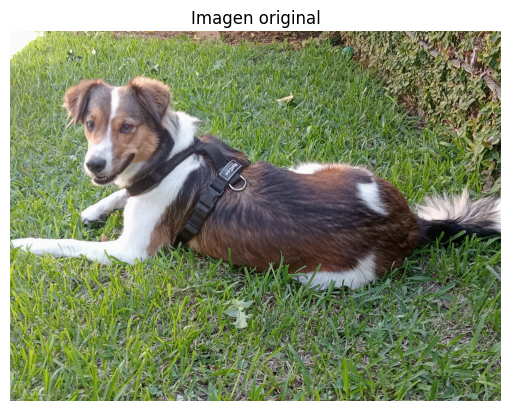

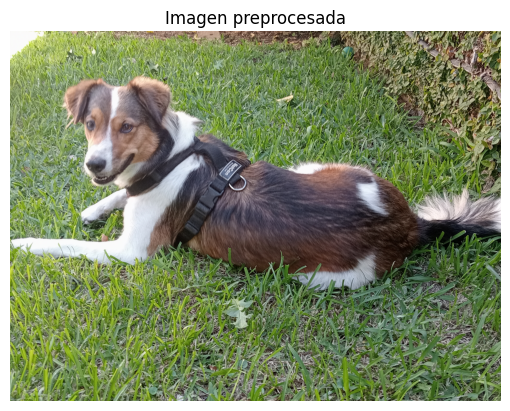

Predicción: Cardigan (46.68%)


<ipython-input-136-811e0d7aab3b>:3: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)


In [ ]:
pred, pres =predecirFoto("/content/drive/MyDrive/IMG20250329155612.jpg")
nuevo_registro = {'categoria': 'luna', 'modelo':'ResNet18', 'prediccion': pred, 'precision': pres.item()}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)


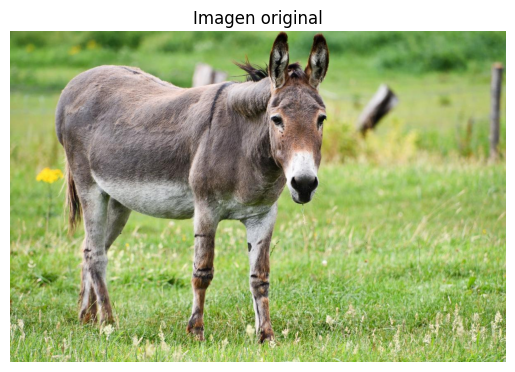

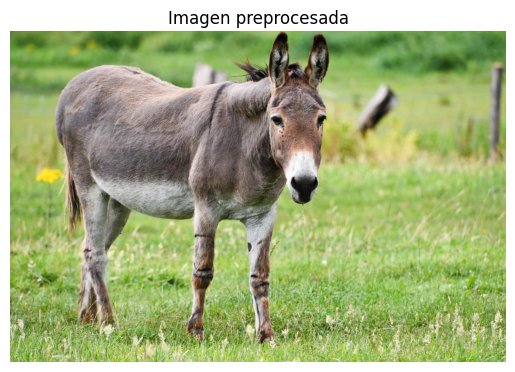

Predicción: ibex (42.94%)


In [ ]:
pred,pres = predecirFoto("https://cdn0.expertoanimal.com/es/posts/9/8/4/cuanto_vive_un_burro_26489_orig.jpg")
nuevo_registro = {'categoria': 'burro', 'modelo':'ResNet18', 'prediccion': pred, 'precision': pres.item()}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

Un "ibex" es un tipo de cabra salvaje con cuernos largos y curvos. Dado que el burro no es una de las categorías exactas en ImageNet, el modelo hizo la mejor suposición basándose en las características visuales de la imagen que procesó, y la categoría "ibex" fue la que tuvo la mayor probabilidad según su entrenamiento.


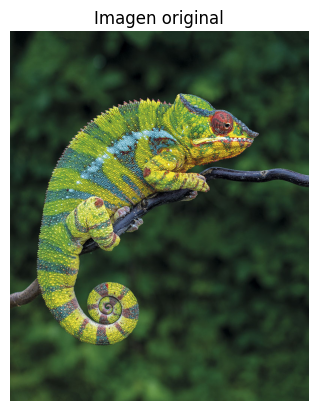

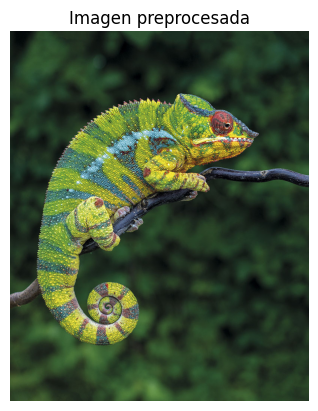

Predicción: African chameleon (99.88%)


('African chameleon', tensor(99.8775))

In [ ]:
predecirFoto("https://content.nationalgeographic.com.es/medio/2018/05/18/camaleon_3f5dd7c4.jpg")

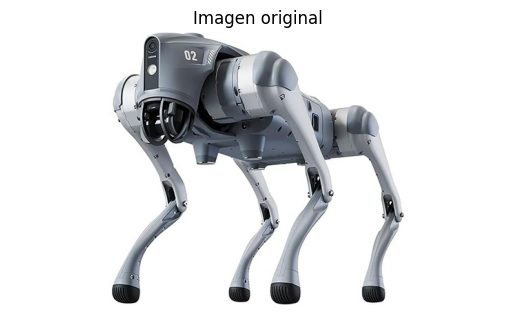

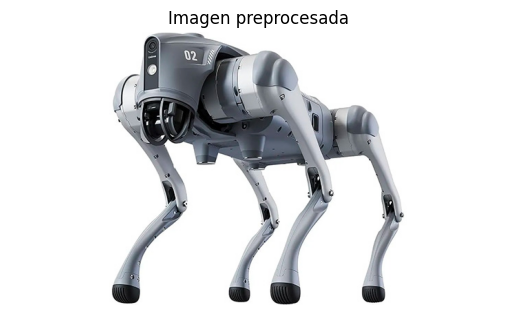

Predicción: disk brake (29.27%)


('disk brake', tensor(29.2669))

In [ ]:
predecirFoto("https://cloudfront-us-east-1.images.arcpublishing.com/copesa/VNLQ3TKCQFEGBOQ7HG7SERIC6U.jpg")

### ResNet 152

Modelo con 152 capas lo que ofrece una mayor precision a costa del costo computacional en operarlo.

In [ ]:
# Cargar modelo preentrenado
modelo = models.resnet152(pretrained=True)
modelo.eval()  # modo evaluación (no entrenamiento)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

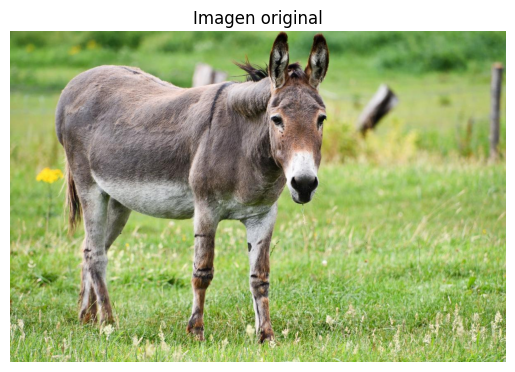

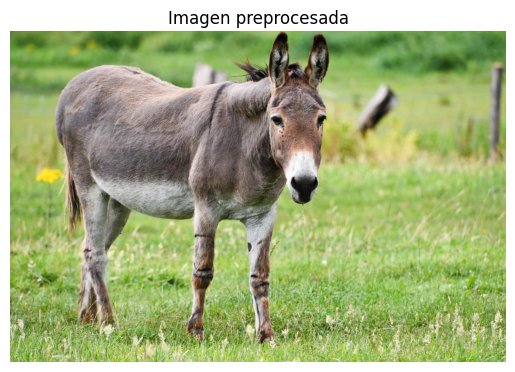

Predicción: gazelle (34.27%)


In [ ]:
pred,pres = predecirFoto("https://cdn0.expertoanimal.com/es/posts/9/8/4/cuanto_vive_un_burro_26489_orig.jpg")
nuevo_registro = {'categoria': 'burro', 'modelo':'ResNet152', 'prediccion': pred, 'precision': pres.item()}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

Hay una diferencia de asignacion a la clase respectoal modelo anterior pero sigue sin poder clasificarlo dado que no esta incluido en los datos de entrenamiento.

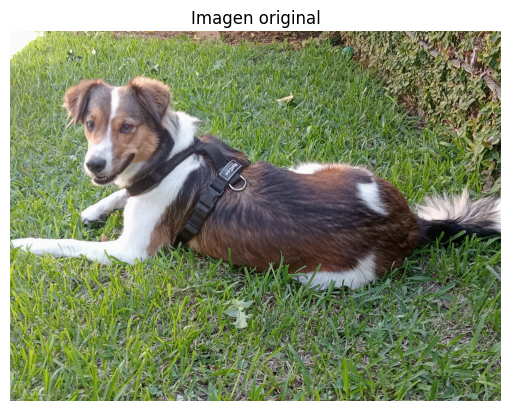

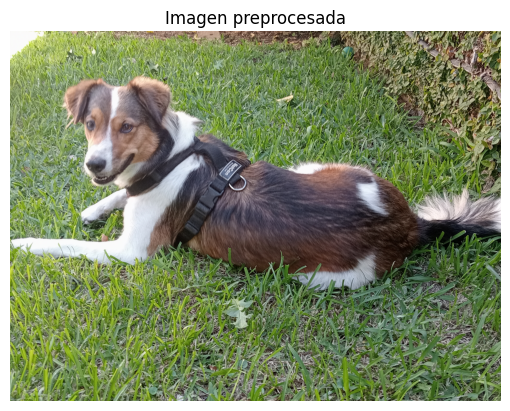

Predicción: basenji (40.90%)


In [ ]:
pred,pres = predecirFoto("/content/drive/MyDrive/IMG20250329155612.jpg")
nuevo_registro = {'categoria': 'luna', 'modelo':'ResNet152', 'prediccion': pred, 'precision': pres.item()}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

### Resnext101_64x4d

Modelo que teoricamente ofrece mayor precision entre los pertenecientes a esta categoria.

In [ ]:
from torchvision.models import resnext101_64x4d, ResNeXt101_64X4D_Weights

# Cargar con pesos preentrenados en ImageNet
weights = ResNeXt101_64X4D_Weights.DEFAULT
model = resnext101_64x4d(weights=weights)
model.eval()

# 2. Obtener la transformación predefinida del modelo
preprocesado = weights.transforms()


In [ ]:
def predecirFotoRNXT101(origen):
    # Cargar imagen desde URL o ruta local
    if origen.startswith("http://") or origen.startswith("https://"):
        imagen = Image.open(requests.get(origen, stream=True).raw).convert("RGB")
    else:
        imagen = Image.open(origen).convert("RGB")

    # Mostrar imagen original
    plt.imshow(imagen)
    plt.axis("off")
    plt.title("Imagen original")
    plt.show()

    # Preprocesar la imagen
    input_tensor = preprocesado(imagen).unsqueeze(0)  # Agrega dimensión batch

    # Obtener predicción
    with torch.no_grad():
        output = modelo(input_tensor)

    # Obtener etiquetas de ImageNet (ya vienen con los pesos)
    etiquetas = weights.meta["categories"]

    # Interpretar salida
    probabilidades = torch.nn.functional.softmax(output[0], dim=0)
    indice = torch.argmax(probabilidades).item()
    print(f"Predicción: {etiquetas[indice]} ({probabilidades[indice]*100:.2f}%)")
    return etiquetas[indice], probabilidades[indice]*100

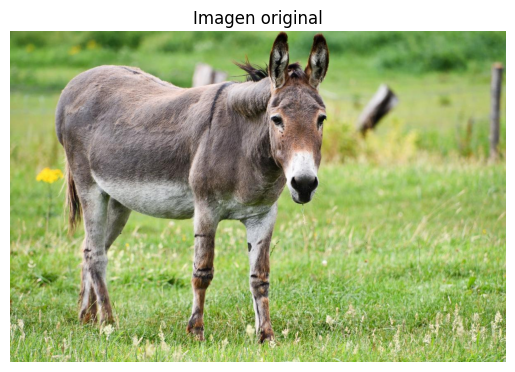

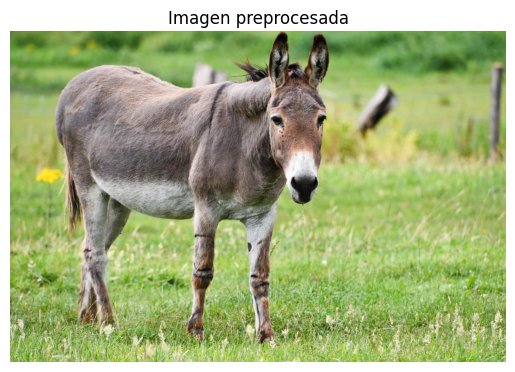

Predicción: gazelle (27.29%)


In [ ]:
pred,pres = predecirFoto("https://cdn0.expertoanimal.com/es/posts/9/8/4/cuanto_vive_un_burro_26489_orig.jpg")
nuevo_registro = {'categoria': 'burro', 'modelo':'Resnext101_64x4d', 'prediccion': pred, 'precision': pres.item()}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

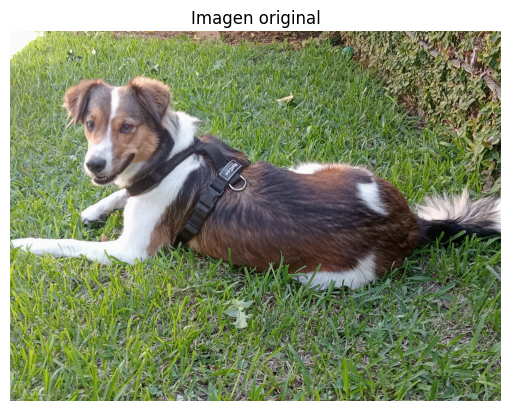

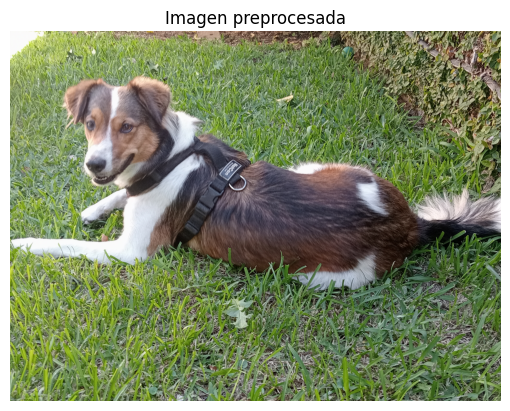

Predicción: basenji (31.52%)


In [ ]:
pred,pres = predecirFoto("/content/drive/MyDrive/IMG20250329155612.jpg")
nuevo_registro = {'categoria': 'luna', 'modelo':'Resnext101_64x4d', 'prediccion': pred, 'precision': pres.item()}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

Las clases detectadas son iguales que el modelo de 152 capas pero con diferente grado de precision.

## Modelos Vision Transformer (ViT)

ViT es una arquitectura de red neuronal basada en Transformers, el mismo tipo de modelo usado en NLP, pero adaptado para visión por computadora.

A diferencia de las CNNs (como ResNet), que usan convoluciones locales para procesar imágenes, ViT:

* Divide la imagen en pequeños parches (por ejemplo, de 16×16 píxeles),

* Los convierte en vectores (embeddings),

* Y los procesa como una secuencia, como si fuera una frase.



### ViT L16
* Entrada 224x224
* Tamaño del parche: 16x16
* Parametros: 307 millones
* Precision 84%

In [ ]:
# Cargo modelo preentrenado ViT-L-16 y etiquetas
weights = models.ViT_L_16_Weights.IMAGENET1K_V1
modelo = models.vit_l_16(weights=weights)
modelo.eval()
categorias = weights.meta["categories"]


Cuando se carga un ResNet con pretrained=True o un ViT con weights=…IMAGENET1K_V1, ambos han sido entrenados sobre el mismo ImageNet‑1K (1 000 clases estándar) y por lo tanto:
* Clases: comparten el mismo listado de 1 000 categorías (perro salchicha, tiburón martillo, etc.).
* Datos: ambos modelos vieron durante el entrenamiento exactamente las mismas ~1,2 millones de imágenes de entrenamiento y las ~50 000 de validación de ImageNet‑1K.


La única diferencia práctica está en:

* Arquitectura: ResNet usa convoluciones + bloques residuales; ViT usa atención sobre “parches” de imagen.
* Preprocesado recomendado: cada modelo viene con su propia rutina weights.transforms() (tamaños de recorte, normalización, augmentations) que refleja el pipeline exacto usado durante su entrenamiento, pero las clases y las imágenes base son idénticas.

In [ ]:
def predecirFotoViTL16(origen):
    # Detecta si es URL o ruta local
    if origen.startswith("http://") or origen.startswith("https://"):
        imagen = Image.open(requests.get(origen, stream=True).raw).convert("RGB")
    else:
        imagen = Image.open(origen).convert("RGB")

    # Muestra la imagen
    plt.imshow(imagen)
    plt.axis("off")
    plt.title("Imagen original")
    plt.show()

    # Preprocesamiento
    input_tensor = preprocesado(imagen).unsqueeze(0)

    # Inferencia
    with torch.no_grad():
        output = modelo(input_tensor)

    # Predicción
    probabilidades = torch.nn.functional.softmax(output[0], dim=0)
    indice = torch.argmax(probabilidades).item()

    pred_clase = categorias[indice]
    confianza = probabilidades[indice].item() * 100

    print(f"Predicción: {pred_clase} ({confianza:.2f}%)")
    return pred_clase, confianza

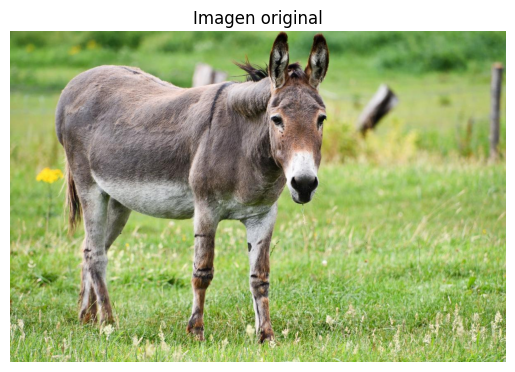

Predicción: gazelle (59.58%)


In [ ]:
pred,pres = predecirFotoViTL16("https://cdn0.expertoanimal.com/es/posts/9/8/4/cuanto_vive_un_burro_26489_orig.jpg")
nuevo_registro = {'categoria': 'burro', 'modelo':'ViTL16', 'prediccion': pred, 'precision': pres}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)


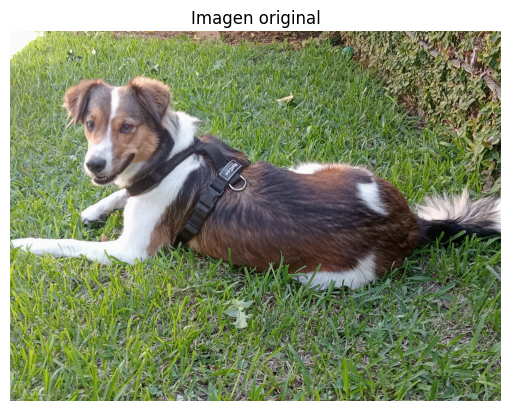

Predicción: Shetland sheepdog (45.81%)


In [ ]:
pred,pres = predecirFotoViTL16("/content/drive/MyDrive/IMG20250329155612.jpg")
nuevo_registro = {'categoria': 'luna', 'modelo':'ViTL16', 'prediccion': pred, 'precision': pres}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

### ViT H14
* Entrada 518x518
* Tamaño del parche: 14x14
* Parametros: 632 millones
* Precision 85/86%

In [ ]:
from torchvision.models import ViT_H_14_Weights

In [ ]:
# Cargo el modelo ViT-H/14 con pesos preentrenados
pesos = ViT_H_14_Weights.DEFAULT
modelo = models.vit_h_14(weights=pesos)
modelo.eval()  # Modo evaluación (no entrenamiento)

# Transformaciones necesariaspara preprocesamiento
preprocesado = pesos.transforms()

In [ ]:
# Función para predecir desde URL o ruta local
def predecirFotoViTH14(origen):
    # Cargo imagen desde URL o local
    if origen.startswith("http://") or origen.startswith("https://"):
        imagen = Image.open(requests.get(origen, stream=True).raw).convert("RGB")
    else:
        imagen = Image.open(origen).convert("RGB")

    # Muestro imagen original
    plt.imshow(imagen)
    plt.axis("off")
    plt.title("Imagen original")
    plt.show()

    # Preprocesamiento
    input_tensor = preprocesado(imagen).unsqueeze(0)  # (1, C, H, W)

    # Predicción sin gradiente
    with torch.no_grad():
        output = modelo(input_tensor)

    # Obtengo probabilidades
    probabilidades = torch.nn.functional.softmax(output[0], dim=0)

    # Obtengo clases
    clases = pesos.meta["categories"]

    # Muestro la clase más probable
    indice = torch.argmax(probabilidades).item()
    clase_predicha = clases[indice]
    confianza = probabilidades[indice].item() * 100

    print(f"Predicción: {clase_predicha} ({confianza:.2f}%)")
    return clase_predicha, confianza

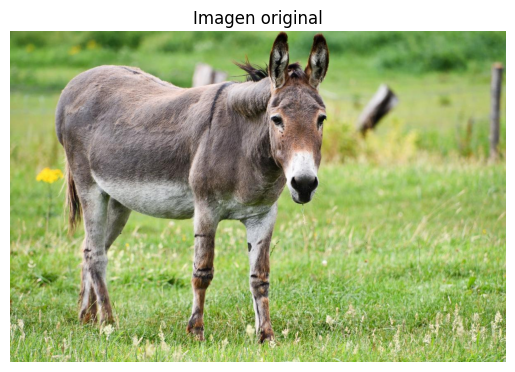

Predicción: zebra (4.29%)


In [ ]:
pred,pres = predecirFotoViTH14("https://cdn0.expertoanimal.com/es/posts/9/8/4/cuanto_vive_un_burro_26489_orig.jpg")
nuevo_registro = {'categoria': 'burro', 'modelo':'ViTH14', 'prediccion': pred, 'precision': pres}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

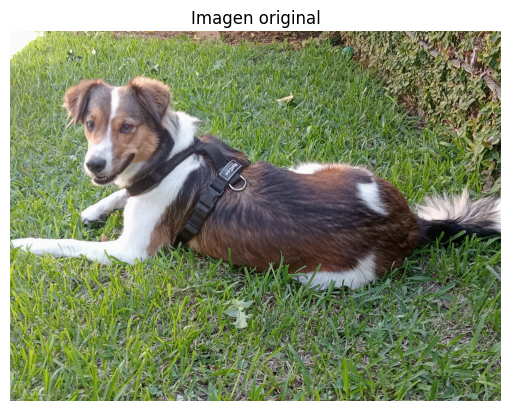

Predicción: collie (19.63%)


In [ ]:
pred,pres = predecirFotoViTH14("/content/drive/MyDrive/IMG20250329155612.jpg")
nuevo_registro = {'categoria': 'luna', 'modelo':'ViTH14', 'prediccion': pred, 'precision': pres}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

## Modelos EfficientNet
Los EfficientNet son una familia de arquitecturas de Redes Neuronales Convolucionales diseñadas para maximizar la precisión a la vez que minimizan el tamaño y el costo computacional.

El modelo utiliza un escalado compuesto, en vez de aumentar solo la profundidad (capas), o el ancho (número de canales), o la resolución de la entrada, EfficientNet propone escalar todas tres dimensiones simultáneamente de forma balanceada mediante factores determinados por un pequeño algoritmo de búsqueda. Esto da como resultado una familia de modelos que van de muy ligeros a muy potentes, etiquetados como B0 (el más pequeño) hasta B7 (el más grande).




#### EfficientNET B7

In [ ]:
# Cargo modelo EfficientNet-B7 con pesos preentrenados en ImageNet
weights = models.EfficientNet_B7_Weights.IMAGENET1K_V1
modelo = models.efficientnet_b7(weights=weights)
modelo.eval()

# Transformacion estándar del modelo (automáticamente asociada al weight)
preprocesado = weights.transforms()
categorias = weights.meta["categories"]


In [ ]:
# Función para predecir imagen desde URL o ruta local
def predecirFotoEffB7(origen):
    # Cargo imagen desde URL o ruta local
    if origen.startswith("http://") or origen.startswith("https://"):
        imagen = Image.open(requests.get(origen, stream=True).raw).convert("RGB")
    else:
        imagen = Image.open(origen).convert("RGB")

    # Muestro imagen original
    plt.imshow(imagen)
    plt.axis("off")
    plt.title("Imagen original")
    plt.show()

    # Preprocesamiento de la imagen
    input_tensor = preprocesado(imagen).unsqueeze(0)  # [1, 3, 600, 600] aprox

    # Inferencia
    with torch.no_grad():
        output = modelo(input_tensor)

    # Softmax para probabilidades
    probabilidades = torch.nn.functional.softmax(output[0], dim=0)
    indice = torch.argmax(probabilidades).item()

    # Muestra el  resultado
    pred_clase = categorias[indice]
    confianza = probabilidades[indice].item() * 100

    print(f"Predicción: {pred_clase} ({confianza:.2f}%)")
    return pred_clase, confianza

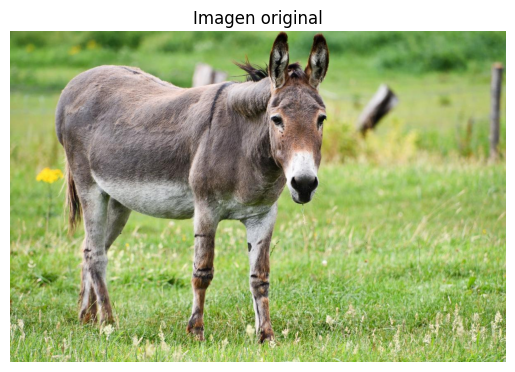

Predicción: gazelle (34.56%)


In [ ]:
pred, pres = predecirFotoEffB7("https://cdn0.expertoanimal.com/es/posts/9/8/4/cuanto_vive_un_burro_26489_orig.jpg")
nuevo_registro = {'categoria': 'burro', 'modelo':'EfficientNETB7', 'prediccion': pred, 'precision': pres}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

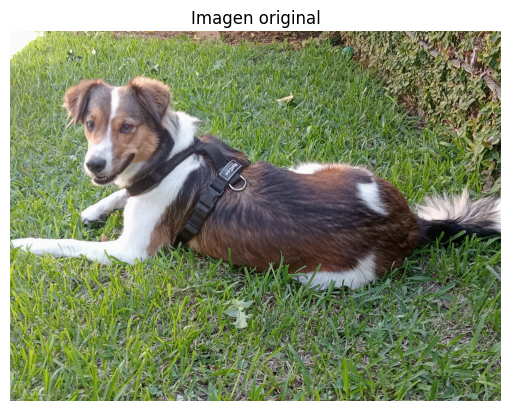

Predicción: Cardigan (21.34%)


In [ ]:
pred,pres = predecirFotoEffB7("/content/drive/MyDrive/IMG20250329155612.jpg")
nuevo_registro = {'categoria': 'luna', 'modelo':'EfficientNETB7', 'prediccion': pred, 'precision': pres}
dfcomparativo = pd.concat([dfcomparativo, pd.DataFrame([nuevo_registro])], ignore_index=True)

## Comparativa modelos

In [ ]:
dfcomparativo.sort_values(by='categoria', ascending=False)

,categoria,modelo,prediccion,precision
0,luna,ResNet18,Cardigan,46.677860
3,luna,ResNet152,basenji,40.904236
5,luna,Resnext101_64x4d,basenji,31.519907
7,luna,ViTL16,Shetland sheepdog,45.812792
9,luna,ViTH14,collie,19.627991
11,luna,EfficientNETB7,Cardigan,21.337332
1,burro,ResNet18,ibex,42.942463
2,burro,ResNet152,gazelle,34.268230
4,burro,Resnext101_64x4d,gazelle,27.289274
6,burro,ViTL16,gazelle,59.578580


## Conclusion
Del analisis de los resultados de los distintos modelos, el modelo de vision transformer ViTH14 ofrece las predicciones mas cercanas para estas imagenes no incluidas en los datos de entrenamiento.